Для отрисовки графа будем использовать аналог circular layout алгоритма из Networkx. Этот алгоритм при визуализации располагает вершины графа в окружности, чтобы показать связи между вершинами более явно. 
На вход алгоритму подается матрица смежности. Целью является равномерно расположить вершины на окружности, поэтому берется отрезок от 0 до 2$\pi$ и делится на "число вершин + 1" отрезков. Таким образом мы получаем угол отклонения, соответствующий каждой вершине. Но так как для визуалиции графа требуются координаты, то для каждой вершины соответствующими координатами будет являться пара (косинус угла отклонения, синус угла отклонения).

In [31]:
import math

def get_circular_coord(matrix):
    if (len(matrix) == 1):
        return [(0, 0)]
    else:
        coord_angles = np.linspace(0, 2*math.pi, len(matrix) + 1)[:-1]
        return [(math.cos(angle), math.sin(angle)) for angle in coord_angles]

In [38]:
import matplotlib.pyplot as plt

def draw_graph(matrix, coord):
    plt.figure(figsize=(30,  30))
    x, y = zip(*coord)

    plt.scatter(x, y)
    for i in range(len(matrix)):
        for j in range(0, i+1):
            if (matrix[i][j] == 1):
                plt.plot([coord[i][0], coord[j][0]], [coord[i][1], coord[j][1]])
    plt.show()

Полный граф

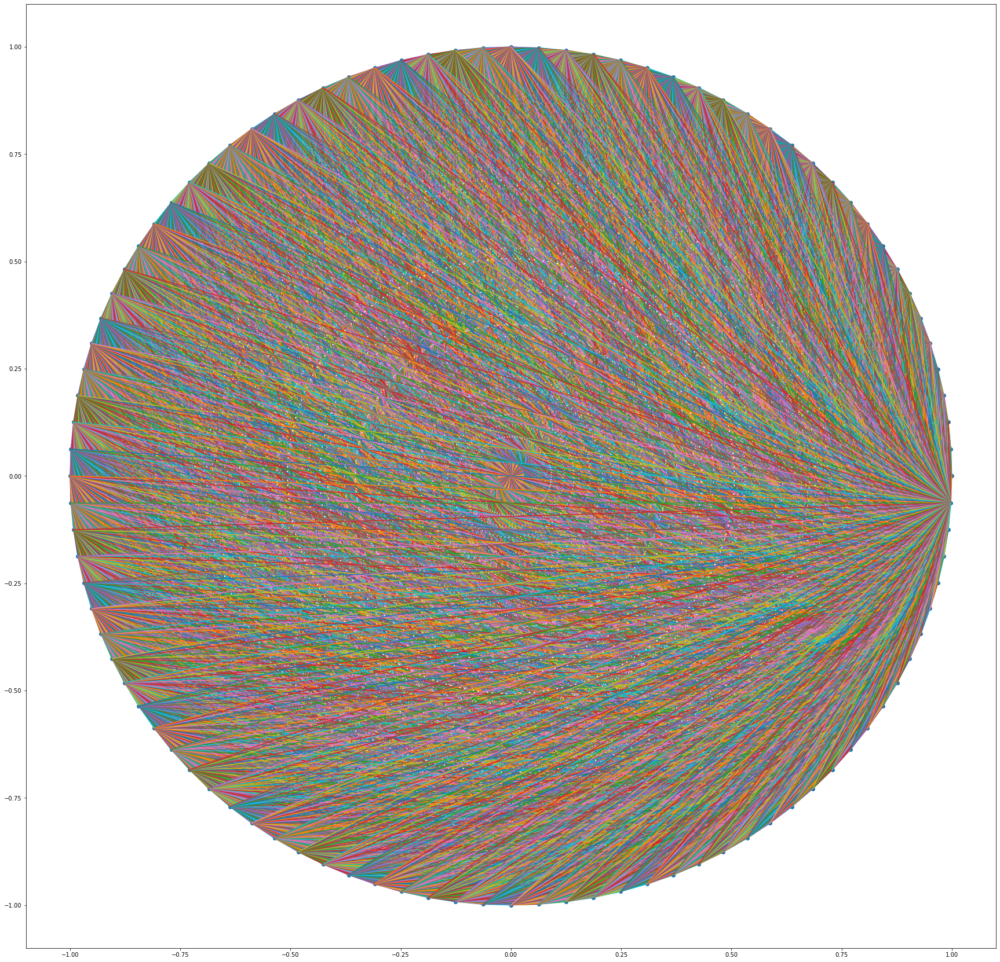

In [47]:
import networkx as nx

g = nx.complete_graph(100)
matrix_bi = nx.adjacency_matrix(g).toarray()

coord = get_circular_coord(matrix_bi)
draw_graph(matrix_bi, coord)

Полный двудольный граф

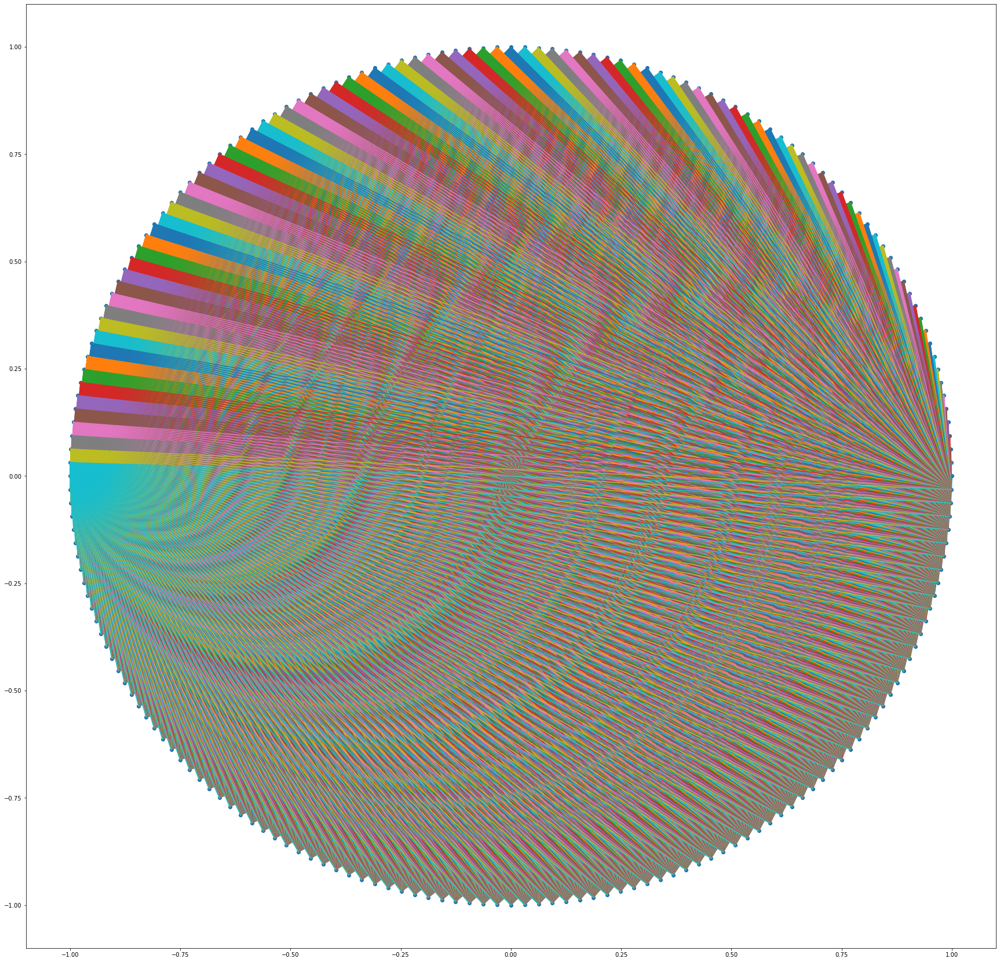

In [50]:
g = nx.complete_bipartite_graph(100, 100)
matrix_bip = nx.adjacency_matrix(g).toarray()

coord = get_circular_coord(matrix_bip)
draw_graph(matrix_bip, coord)

Граф-цикл

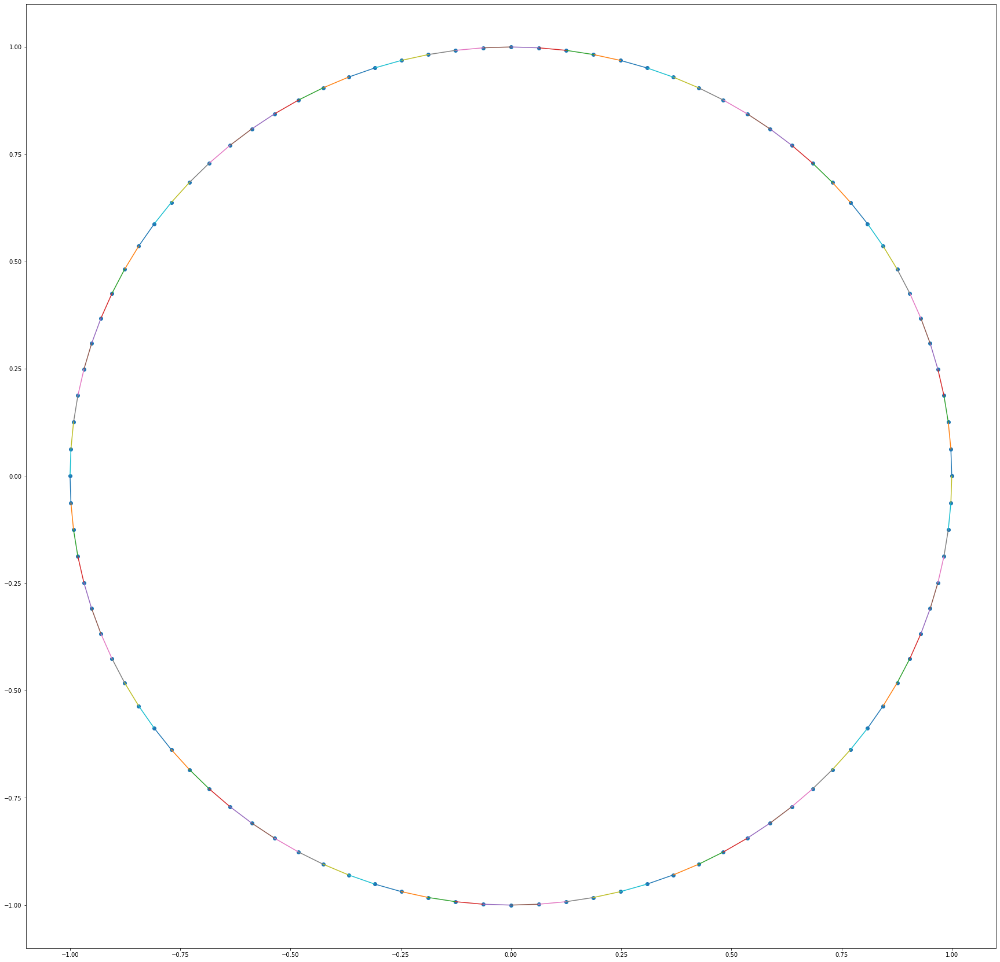

In [51]:
g = nx.cycle_graph(100)
matrix_cycle = nx.adjacency_matrix(g).toarray()

coord = get_circular_coord(matrix_cycle)
draw_graph(matrix_cycle, coord)